# Train a Semantic Segmentation Model using Segmentation-Models-PyTorch

[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/geoai/blob/main/docs/examples/train_segmentation_model.ipynb)

This notebook demonstrates how to train semantic segmentation models for object detection (e.g., building detection) using the [segmentation-models-pytorch](https://smp.readthedocs.io) library. Unlike instance segmentation with Mask R-CNN, this approach treats the task as pixel-level binary classification.

## Install packages
To use the new functionality, ensure the required packages are installed.


In [6]:
%pip install geoai-py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.9/632.9 kB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.5/122.5 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 69.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.5/20.5 MB 112.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 110.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1

## Import libraries

In [7]:
import geoai

## Download sample data

We'll use the same dataset as the Mask R-CNN example for consistency.

In [8]:
train_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_rgb_train.tif"
)
train_vector_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train_buildings.geojson"
test_raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_test.tif"
)

In [9]:
train_raster_path = geoai.download_file(train_raster_url)
train_vector_path = geoai.download_file(train_vector_url)
test_raster_path = geoai.download_file(test_raster_url)

## Visualize sample data

In [10]:
geoai.get_raster_info(train_raster_path)

{'driver': 'GTiff',
 'width': 2503,
 'height': 1126,
 'count': 3,
 'dtype': 'uint8',
 'crs': 'EPSG:26911',
 'transform': Affine(0.6000000000000046, 0.0, 454780.8,
        0.0, -0.6, 5278242.6),
 'bounds': BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6),
 'resolution': (0.6000000000000046, 0.6),
 'nodata': None,
 'band_stats': [{'band': 1,
   'min': 12.0,
   'max': 251.0,
   'mean': 150.6730747259594,
   'std': 48.01908734374099},
  {'band': 2,
   'min': 49.0,
   'max': 251.0,
   'mean': 141.92468895229808,
   'std': 43.46595463573497},
  {'band': 3,
   'min': 53.0,
   'max': 251.0,
   'mean': 120.89909373405554,
   'std': 41.78086244480775}]}

In [11]:
# geoai.view_vector_interactive(train_vector_path, tiles=train_raster_path) # this gives only plain image
geoai.view_vector_interactive(train_vector_path, tiles=train_raster_url)

In [12]:
geoai.view_raster(test_raster_path)

## Create training data

We'll create the same training tiles as before.

In [13]:
out_folder = "buildings"
tiles = geoai.export_geotiff_tiles(
    in_raster=train_raster_path,
    out_folder=out_folder,
    in_class_data=train_vector_path,
    tile_size=512,  #divides the image into blocks of 512*512 pixels to create training data
    stride=256,    #for overlapping bulding so that data is correctly measured
    buffer_radius=0,  #for identifying roads and networks
)


Raster info for naip_rgb_train.tif:
  CRS: EPSG:26911
  Dimensions: 2503 x 1126
  Resolution: (0.6000000000000046, 0.6)
  Bands: 3
  Bounds: BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6)
Loaded 735 features from naip_train_buildings.geojson
Vector CRS: EPSG:4326
Reprojecting features from EPSG:4326 to EPSG:26911
Found 1 unique classes: ['building']


Generated: 36, With features: 36: 100%|██████████| 36/36 [00:06<00:00,  5.35it/s]


------- Export Summary -------
Total tiles exported: 36
Tiles with features: 36 (100.0%)
Average feature pixels per tile: 46795.0
Output saved to: buildings

------- Georeference Verification -------


## Train semantic segmentation model

Now we'll train a semantic segmentation model using the new `train_segmentation_model` function. This function supports various architectures from `segmentation-models-pytorch`:

- **Architectures**: `unet`, `unetplusplus` `deeplabv3`, `deeplabv3plus`, `fpn`, `pspnet`, `linknet`, `manet`
- **Encoders**: `resnet34`, `resnet50`, `efficientnet-b0`, `mobilenet_v2`, etc.

For more details, please refer to the [segmentation-models-pytorch documentation](https://smp.readthedocs.io/en/latest/models.html).

### Example 1: U-Net with ResNet34 encoder


In [22]:
# Train U-Net model
# so here we are choosing and architecture i.e the steps between i/p and o/p and the encoder i.e how images will be
#converted to numbers for the machine to understand and then training the model
geoai.train_segmentation_model(
    images_dir=f"{out_folder}/images",
    labels_dir=f"{out_folder}/labels",
    output_dir=f"{out_folder}/unet_models",
    architecture="unet",
    encoder_name="resnet34",
    encoder_weights="imagenet",
    num_channels=3,  #this depends upon the band of the spectrum we are using rgb img so band is 3
    num_classes=2,  # background and building
    batch_size=8,  #how many images in one round
    num_epochs=20,  #how many tiumes should the data set be entirely serached
    learning_rate=0.001,  #speed of learning
    val_split=0.2,  #validation and training split here is 20:80 to prevent overfitting
    verbose=True,
)

Using device: cuda
Found 36 image files and 36 label files
Training on 28 images, validating on 8 images
Checking image sizes for compatibility...
All sampled images have the same size: (512, 512)
No resizing needed.
Testing data loader...
Data loader test passed.
Starting training with unet + resnet34
Model parameters: 24,436,514
Epoch: 1, Batch: 1/4, Loss: 0.5944, Time: 2.01s
Epoch 1/20: Train Loss: 0.4697, Val Loss: 0.4332, Val IoU: 0.4902, Val F1: 0.5835, Val Precision: 0.6575, Val Recall: 0.5762
Saving best model with IoU: 0.4902
Epoch: 2, Batch: 1/4, Loss: 0.3526, Time: 1.53s
Epoch 2/20: Train Loss: 0.3015, Val Loss: 1.3010, Val IoU: 0.5125, Val F1: 0.6136, Val Precision: 0.6918, Val Recall: 0.5977
Saving best model with IoU: 0.5125
Epoch: 3, Batch: 1/4, Loss: 0.2357, Time: 1.50s
Epoch 3/20: Train Loss: 0.2000, Val Loss: 8.7563, Val IoU: 0.4317, Val F1: 0.4876, Val Precision: 0.5797, Val Recall: 0.5122
Epoch: 4, Batch: 1/4, Loss: 0.1590, Time: 1.73s
Epoch 4/20: Train Loss: 0.1637

### Example 2: SegFormer with resnet152 encoder

In [16]:
geoai.train_segmentation_model(
    images_dir=f"{out_folder}/images",
    labels_dir=f"{out_folder}/labels",
    output_dir=f"{out_folder}/segformer_models",
    architecture="segformer",
    encoder_name="resnet152",
    encoder_weights="imagenet",
    num_channels=3,
    num_classes=2,
    batch_size=6,  # Smaller batch size for more complex model
    num_epochs=20,
    learning_rate=0.0005,
    val_split=0.2,
)

Using device: cuda
Found 36 image files and 36 label files
Training on 28 images, validating on 8 images
Checking image sizes for compatibility...
All sampled images have the same size: (512, 512)
No resizing needed.
Testing data loader...
Data loader test passed.


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/241M [00:00<?, ?B/s]

Starting training with segformer + resnet152
Model parameters: 59,473,218
Epoch: 1, Batch: 1/5, Loss: 0.7572, Time: 2.92s
Epoch 1/20: Train Loss: 0.6641, Val Loss: 0.6367, Val IoU: 0.4279, Val F1: 0.4742, Val Precision: 0.8826, Val Recall: 0.5096
Saving best model with IoU: 0.4279
Epoch: 2, Batch: 1/5, Loss: 0.3918, Time: 1.69s
Epoch 2/20: Train Loss: 0.3080, Val Loss: 1.8334, Val IoU: 0.4294, Val F1: 0.5377, Val Precision: 0.5388, Val Recall: 0.5462
Saving best model with IoU: 0.4294
Epoch: 3, Batch: 1/5, Loss: 0.2402, Time: 1.54s
Epoch 3/20: Train Loss: 0.2079, Val Loss: 0.8182, Val IoU: 0.5167, Val F1: 0.6289, Val Precision: 0.6480, Val Recall: 0.6336
Saving best model with IoU: 0.5167
Epoch: 4, Batch: 1/5, Loss: 0.1919, Time: 1.75s
Epoch 4/20: Train Loss: 0.1691, Val Loss: 0.2767, Val IoU: 0.6694, Val F1: 0.7774, Val Precision: 0.8293, Val Recall: 0.7539
Saving best model with IoU: 0.6694
Epoch: 5, Batch: 1/5, Loss: 0.1356, Time: 1.81s
Epoch 5/20: Train Loss: 0.1508, Val Loss: 0.22

## Run inference

Now we'll use the trained model to make predictions on the test image.

In [18]:
# Define paths
masks_path = "naip_test_semantic_prediction.tif"
model_path = f"{out_folder}/unet_models/best_model.pth"

In [25]:
# Run semantic segmentation inference
geoai.semantic_segmentation(
    input_path=test_raster_path,
    output_path=masks_path,
    model_path=model_path,
    architecture="unet",
    encoder_name="resnet34",
    num_channels=3,
    num_classes=2,
    window_size=512,
    overlap=256,
    batch_size=4,
)

Input file format: GeoTIFF (.tif)
Processing 65 windows...


84it [00:02, 39.82it/s]


Predicted classes: 2 classes, Background: 89.6%
Inference completed in 2.77 seconds
Saved prediction to naip_test_semantic_prediction.tif


In [29]:
# to check if the prediction failed or the visualisation failed
import rasterio
import numpy as np

with rasterio.open(masks_path) as src:
    mask = src.read(1)
    print(np.unique(mask))


[0 1]


In [37]:
geoai.view_raster(masks_path,  nodata=0, basemap=test_raster_path , backend="folium",  colormap="Reds",
    opacity=0.4)

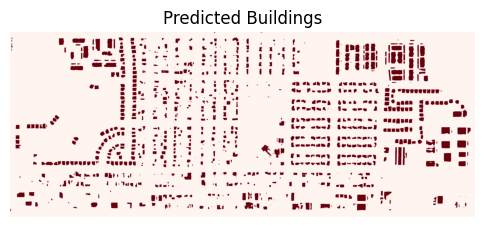

In [34]:
import rasterio
import matplotlib.pyplot as plt

with rasterio.open(masks_path) as src:
    mask = src.read(1)

plt.figure(figsize=(6, 6))
plt.imshow(mask, cmap="Reds")
plt.title("Predicted Buildings")
plt.axis("off")
plt.show()


In [35]:
geoai.view_raster(
    prob_map_path,
    basemap=test_raster_path,
    backend="folium",
    colormap="YlOrRd",
    opacity=0.8
)


NameError: name 'prob_map_path' is not defined

## Output probability map (optional)

You can also output the probability map by providing the `probability_path` parameter. This will save a multi-band raster where each band represents the probability for each class (0-1 range).

In [38]:
# Run inference with probability output
probability_path = "naip_test_probability_map.tif"

geoai.semantic_segmentation(
    input_path=test_raster_path,
    output_path=masks_path,
    model_path=model_path,
    architecture="unet",
    encoder_name="resnet34",
    num_channels=3,
    num_classes=2,
    window_size=512,
    overlap=256,
    batch_size=4,
    probability_path=probability_path,  # Output probability map
)

Input file format: GeoTIFF (.tif)
Processing 65 windows...


84it [00:02, 40.52it/s]


Predicted classes: 2 classes, Background: 89.6%
Inference completed in 2.68 seconds
Saved prediction to naip_test_semantic_prediction.tif
Saved probability map to naip_test_probability_map.tif


In [39]:
# Visualize probability map for building class (band 2)
geoai.view_raster(
    probability_path, indexes=[2], basemap=test_raster_path, backend="ipyleaflet"
)

Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

You can also control the classification threshold for binary segmentation. By default, argmax is used, but you can specify a custom threshold:

In [40]:
# Run inference with custom probability threshold
masks_path_threshold = "naip_test_semantic_prediction_threshold2.tif"

geoai.semantic_segmentation(
    input_path=test_raster_path,
    output_path=masks_path_threshold,
    model_path=model_path,
    architecture="unet",
    encoder_name="resnet34",
    num_channels=3,
    num_classes=2,
    window_size=512,
    overlap=256,
    batch_size=4,
    probability_threshold=0.3,  # Only classify as building if probability >= 0.7
)

Input file format: GeoTIFF (.tif)
Processing 65 windows...


84it [00:02, 40.45it/s]


Using probability threshold: 0.3
Predicted classes: 2 classes, Background: 88.3%
Inference completed in 2.61 seconds
Saved prediction to naip_test_semantic_prediction_threshold2.tif


## Vectorize masks

Convert the predicted mask to vector format for better visualization and analysis.

In [41]:
output_vector_path = "naip_test_semantic_prediction.geojson"
gdf = geoai.orthogonalize(masks_path, output_vector_path, epsilon=2)

Processing 1062 features...


Converting features: 100%|██████████| 1062/1062 [00:11<00:00, 95.06shape/s] 


Saving to naip_test_semantic_prediction.geojson...
Done!


## Add geometric properties

In [42]:
gdf_props = geoai.add_geometric_properties(gdf, area_unit="m2", length_unit="m")

## Visualize results

In [43]:
geoai.view_raster(masks_path, nodata=0, basemap=test_raster_path, backend="ipyleaflet")

Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [48]:
geoai.view_vector_interactive(gdf_props, column="area_m2", tiles=test_raster_url)

In [46]:
gdf_filtered = gdf_props[(gdf_props["area_m2"] > 50)]

In [47]:
geoai.view_vector_interactive(gdf_filtered, column="area_m2", tiles=test_raster_path)

In [49]:
geoai.create_split_map(
    left_layer=gdf_filtered,
    right_layer=test_raster_path,
    left_args={"style": {"color": "red", "fillOpacity": 0.2}},
    basemap=test_raster_path,
)

Map(center=[47.6464835, -117.59043650000001], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

## Model Performance Analysis

Let's examine the training curves and model performance:

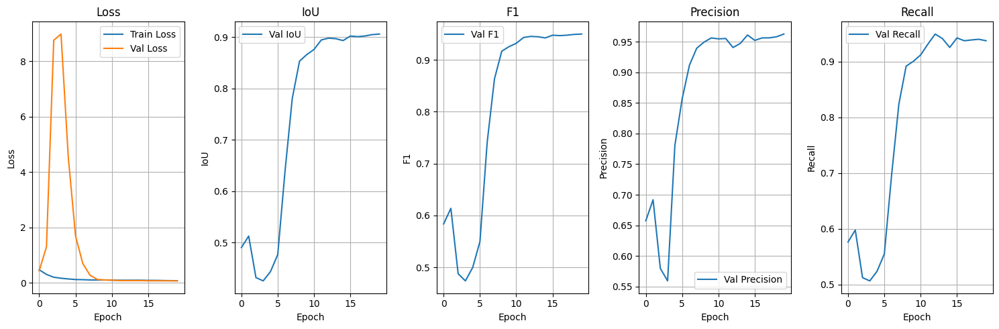


=== Performance Metrics Summary ===
IoU     - Best: 0.9062 | Final: 0.9062
F1      - Best: 0.9496 | Final: 0.9496
Precision - Best: 0.9626 | Final: 0.9626
Recall  - Best: 0.9497 | Final: 0.9377
Val Loss - Best: 0.0683 | Final: 0.0683



,epoch,train_loss,val_loss,val_iou,val_f1,val_precision,val_recall
0,1,0.469713,0.433245,0.490221,0.583536,0.657496,0.576176
1,2,0.301539,1.300979,0.512488,0.613608,0.691822,0.597679
2,3,0.199979,8.756314,0.431694,0.487636,0.579668,0.512163
3,4,0.163742,8.980548,0.425196,0.473781,0.559259,0.506373
4,5,0.138571,4.541530,0.443213,0.499436,0.780604,0.523719
5,6,0.116910,1.689605,0.476517,0.549480,0.856482,0.554744
6,7,0.112876,0.694430,0.638611,0.741289,0.911484,0.696537
7,8,0.101993,0.270914,0.780696,0.863115,0.939282,0.823924
8,9,0.099467,0.120401,0.853436,0.916464,0.949255,0.892057
9,10,0.101476,0.101459,0.866209,0.925307,0.956219,0.900781


In [17]:
geoai.plot_performance_metrics(
    history_path=f"{out_folder}/unet_models/training_history.pth",
    figsize=(15, 5),
    verbose=True,
)

![image](https://github.com/user-attachments/assets/9355446f-f9ba-4818-aedb-4bb5dee56813)

## Performance Metrics

**IoU (Intersection over Union)** and **Dice score** are both popular metrics used to evaluate the similarity between two binary masks—often in image segmentation tasks. While they are related, they are not the same.

---

### 🔸 **Definitions**

#### **IoU (Jaccard Index)**

$$
\text{IoU} = \frac{|A \cap B|}{|A \cup B|}
$$

* Measures the overlap between predicted region $A$ and ground truth region $B$ relative to their union.
* Ranges from 0 (no overlap) to 1 (perfect overlap).

#### **Dice Score (F1 Score for Sets)**

$$
\text{Dice} = \frac{2|A \cap B|}{|A| + |B|}
$$

* Measures the overlap between $A$ and $B$, but gives more weight to the intersection.
* Also ranges from 0 to 1.

---

### 🔸 **Key Differences**

| Metric   | Formula                     | Penalizes                      | Sensitivity                      |
| -------- | --------------------------- | ------------------------------ | -------------------------------- |
| **IoU**  | $\frac{TP}{TP + FP + FN}$   | FP and FN equally              | Less sensitive to small objects  |
| **Dice** | $\frac{2TP}{2TP + FP + FN}$ | Less harsh on small mismatches | More sensitive to small overlaps |

> TP: True Positive, FP: False Positive, FN: False Negative

---

### 🔸 **Relationship**

Dice and IoU are mathematically related:

$$
\text{Dice} = \frac{2 \cdot \text{IoU}}{1 + \text{IoU}} \quad \text{or} \quad \text{IoU} = \frac{\text{Dice}}{2 - \text{Dice}}
$$

---

### 🔸 **When to Use What**

* **IoU**: Common in object detection and semantic segmentation benchmarks (e.g., COCO, Pascal VOC).
* **Dice**: Preferred in medical imaging and when class imbalance is an issue, due to its sensitivity to small regions.